<a href="https://colab.research.google.com/github/Claptar/Cats-vs-Dogs/blob/master/DE%20/human_young_vs_old_scanpy/L2_young_vs_old.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Dependencies and files

## Install dependencies

In [ ]:
!pip install scanpy[leiden] anndata2ri scikit-misc scvi-tools squidpy gseapy==0.10.8 --quiet

# Необходимо, чтобы конкретно прогрузился matplotlib
import os
os.kill(os.getpid(), 9)

## Imports

In [1]:
import warnings
import scanpy as sc
import squidpy as sq
import anndata as an
import gseapy
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from urllib import request
import json
import os

sc.settings.set_figure_params(dpi=80)
#sc.set_figure_params(facecolor="white", figsize=(8, 8))
warnings.simplefilter(action='ignore', category=FutureWarning)
sc.settings.verbosity = 3

Creating directory /root/.config/bioservices 


# Global variables

Нужно подключить свой гугл диск

In [4]:
dir_path = 'drive/MyDrive/Spatial project/results/'

In [5]:
os.listdir('drive/MyDrive/Spatial project/results/filtered_samples/')

['human.h5ad', 'chimp.h5ad', 'macaque.h5ad', 'spatial_libd_human.h5ad']

In [6]:
# read young human adata object
human_young = sc.read_h5ad(dir_path + 'filtered_samples/human.h5ad')
print(human_young)

# add _young sufix to layer name
human_young.obs.label.replace({"L6a": "L6", "L6b": "L6"}, inplace=True)
human_young.obs.label = human_young.obs.label.astype('str') + '_young'

AnnData object with n_obs × n_vars = 15417 × 19966
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [7]:
# read young human adata object
human_old = sc.read_h5ad(dir_path + 'filtered_samples/spatial_libd_human.h5ad')
print(human_old)

# add _young sufix to layer name
human_old.obs.label = human_old.obs.label.astype('str') + '_old'

AnnData object with n_obs × n_vars = 42588 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_pct_counts_mt_colors', 'qc_pct_counts_ribo_colors', 'qc_total_counts_colors', 'spatial'
    obsm: 'spatial'


/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [8]:
# concat old and young files
adata = an.concat([human_young, human_old], merge='same',uns_merge="unique")
adata.obs_names_make_unique()
adata

/usr/local/lib/python3.9/dist-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 58005 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors'
    obsm: 'spatial'

In [9]:
samples = list(adata.uns['spatial'].keys())
samples

['human_759',
 'human_j12',
 'human_j3',
 'human_j4',
 'human_j6',
 '151507',
 '151508',
 '151509',
 '151510',
 '151669',
 '151670',
 '151671',
 '151672',
 '151673',
 '151674',
 '151675',
 '151676']

In [10]:
del human_old, human_young

# Посмотрим на картинки

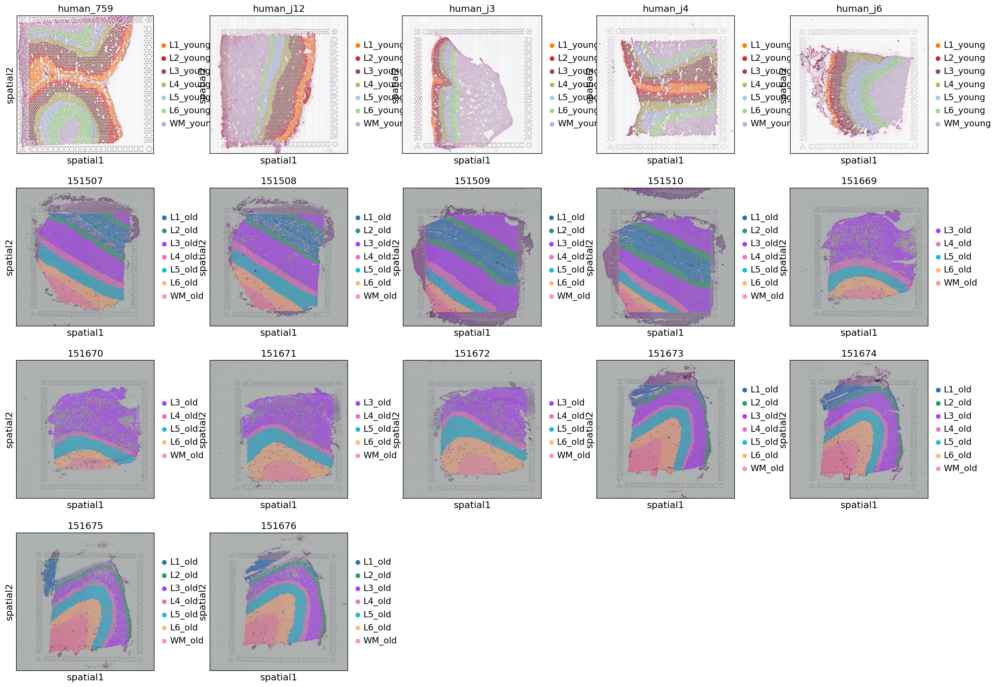

In [11]:
sq.pl.spatial_scatter(adata, color=['label'], library_key='sample_id', size=1.1, ncols=5, title=samples)

# Differential expression

In [12]:
key = 'DE_L2'
groups = ["L2_young", "L2_old"]

In [13]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:01)


In [14]:
de_adata = adata[adata.obs.label.isin(groups)]
de_adata

View of AnnData object with n_obs × n_vars = 3757 × 19404
    obs: 'in_tissue', 'array_row', 'array_col', 'label', 'sample_id', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'feature_types', 'mt', 'hb', 'ribo'
    uns: 'qc_good_spots_colors', 'qc_n_genes_by_counts_colors', 'qc_total_counts_colors', 'spatial', 'qc_pct_counts_mt_colors', 'label_colors', 'log1p'
    obsm: 'spatial'

## Feature selection

In [15]:
sc.pp.highly_variable_genes(
    adata=de_adata, flavor="seurat", 
    n_top_genes=3000, inplace=True,
    batch_key="sample_id")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:07)


/usr/local/lib/python3.9/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [16]:
highly_variable_genes = de_adata.var[de_adata.var.highly_variable].index.tolist()

## PCA

In [17]:
sc.tl.pca(de_adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


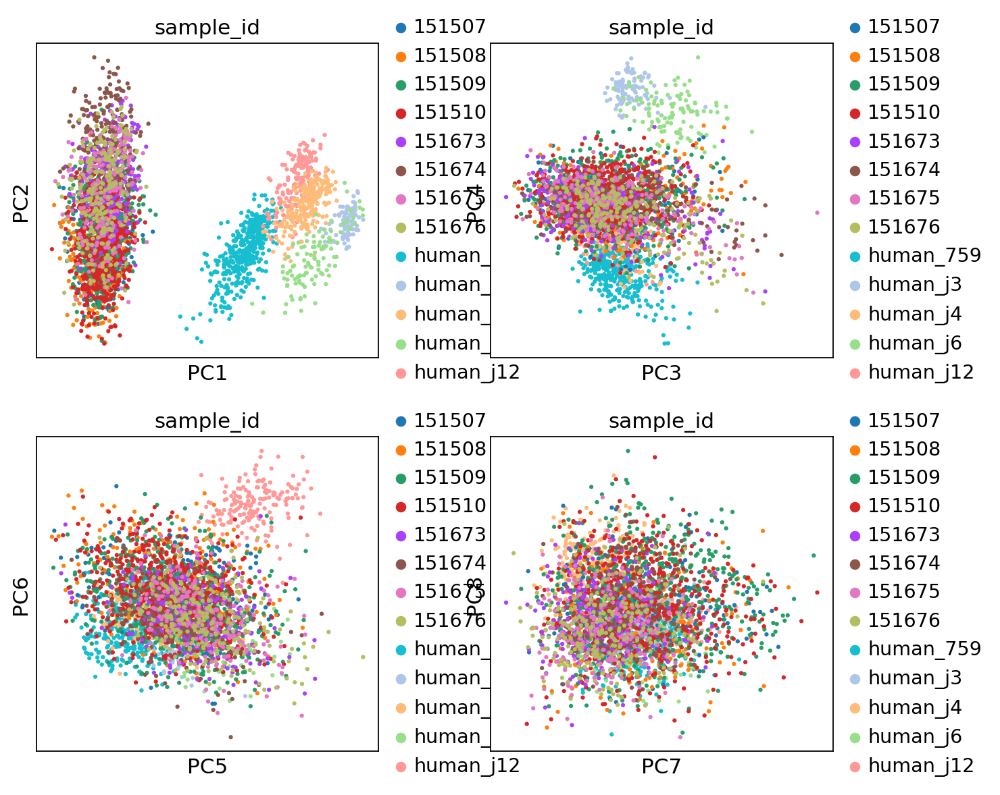

In [18]:
sc.pl.pca(de_adata, color=['sample_id'], components = ['1,2','3,4','5,6','7,8'], ncols=2)

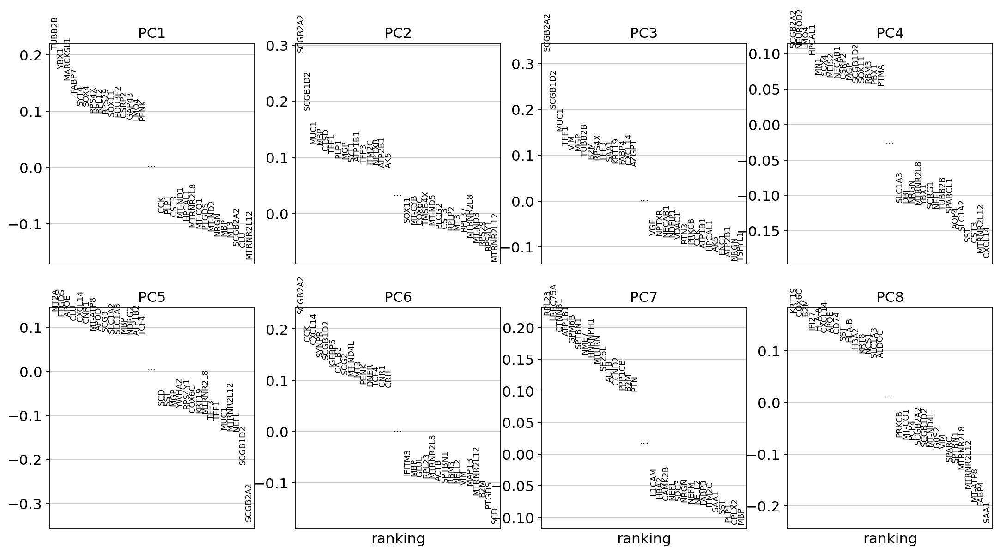

In [19]:
sc.pl.pca_loadings(de_adata, components=[1,2,3,4,5,6,7,8])

Уберем митохондриальные и рибосомные гены

In [20]:
mito = de_adata.var_names.str.startswith('MT-')
hb = de_adata.var_names.str.contains(("^HB[AB]"))
rb = de_adata.var_names.str.contains(("^RP[LS]"))
remove = mito | hb | rb
genes_to_remove = de_adata.var_names[remove].tolist()

keep = np.invert(remove)
print(sum(remove))

de_adata = de_adata[:,keep]

117


In [21]:
# remove genes from `highly_variable_genes`
highly_variable_genes = [gene for gene in highly_variable_genes if gene not in genes_to_remove]

## Rank genes

In [22]:
sc.tl.rank_genes_groups(de_adata, groupby='label', method='wilcoxon', pts=True)
adata.uns[key] = de_adata.uns["rank_genes_groups"]

ranking genes


/usr/local/lib/python3.9/dist-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:15)


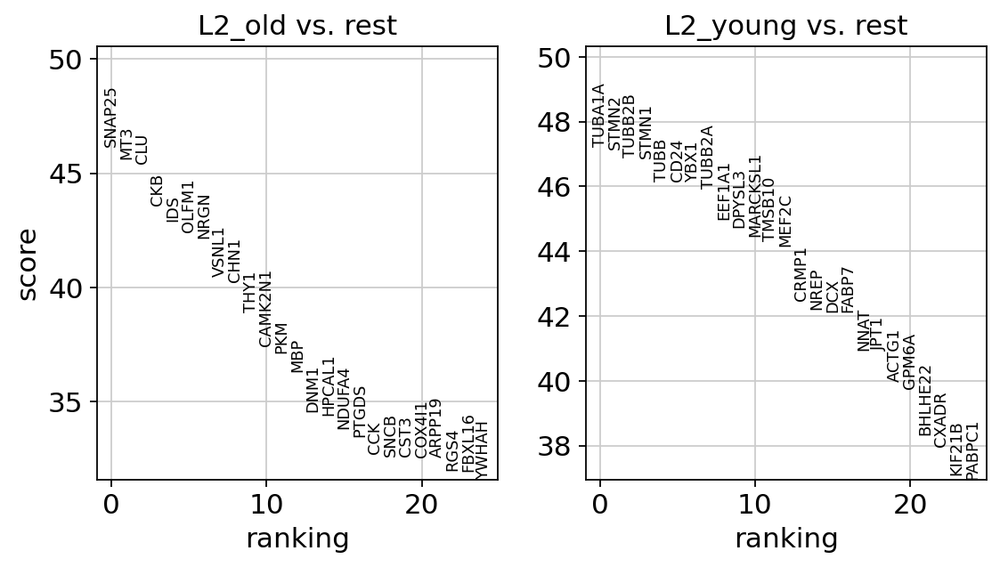

In [23]:
sc.pl.rank_genes_groups(de_adata, n_genes=25, sharey=False)

**TUBA1A** — Microtubules of the eukaryotic cytoskeleton perform essential and diverse functions and are composed of a heterodimer of alpha and beta tubulins

**STMN2** — This gene encodes a member of the stathmin family of phosphoproteins. Stathmin proteins function in microtubule dynamics and signal transduction. The encoded protein plays a regulatory role in neuronal growth and is also thought to be involved in osteogenesis. Reductions in the expression of this gene have been associated with Down's syndrome and Alzheimer's disease.

**YBX1** — This gene encodes a highly conserved cold shock domain protein that has broad nucleic acid binding properties

**SNAP25** — Synaptic vesicle membrane docking and fusion is mediated by SNAREs (soluble N-ethylmaleimide-sensitive factor attachment protein receptors) located on the vesicle membrane (v-SNAREs) and the target membrane (t-SNAREs)

**CLU** — The protein encoded by this gene is a secreted chaperone that can under some stress conditions also be found in the cell cytosol. It has been suggested to be involved in several basic biological events such as cell death, tumor progression, and neurodegenerative disorders.

**MT3** — This gene is a member of the metallothionein family of genes. Proteins encoded by this gene family are low in molecular weight, are cysteine-rich, lack aromatic residues, and bind divalent heavy metal ions. This gene family member displays tissue-specific expression, and contains a threonine insert near its N-terminus and a glutamate-rich hexapeptide insert near its C-terminus relative to the proteins encoded by other gene family members.

## Посмотрим на дифф. экспрессированые гены

In [24]:
genes_rank_df = sc.get.rank_genes_groups_df(de_adata, group=groups[0])
genes_rank_df.index = genes_rank_df.names
genes_rank_df['abs_lfc'] = genes_rank_df['logfoldchanges'].abs()
genes_rank_df['abs_scores'] = genes_rank_df['scores'].abs()
genes_rank_df

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,abs_scores
names,,,,,,,,,
TUBA1A,TUBA1A,47.237171,3.965940,0.0,0.0,1.000000,0.870567,3.965940,47.237171
STMN2,STMN2,47.139286,3.905629,0.0,0.0,1.000000,0.711883,3.905629,47.139286
TUBB2B,TUBB2B,46.897518,4.597810,0.0,0.0,0.999022,0.455210,4.597810,46.897518
STMN1,STMN1,46.867607,2.327281,0.0,0.0,1.000000,0.949543,2.327281,46.867607
TUBB,TUBB,46.151806,3.286019,0.0,0.0,0.999022,0.688483,3.286019,46.151806
...,...,...,...,...,...,...,...,...,...
IDS,IDS,-42.874268,-5.531898,0.0,0.0,0.184932,0.923583,5.531898,42.874268
CKB,CKB,-43.600666,-2.008229,0.0,0.0,0.940313,0.992687,2.008229,43.600666
CLU,CLU,-45.403996,-2.792542,0.0,0.0,0.890411,0.996344,2.792542,45.403996


### Распределение p-value

<Axes: >

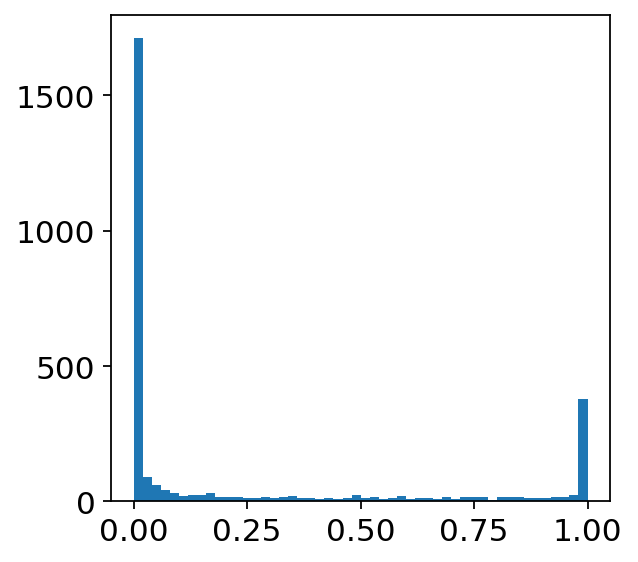

In [25]:
genes_rank_df.loc[highly_variable_genes, 'pvals_adj'].hist(bins=50, grid=False)

Не понимаю на сколько нормально видеть такую картину

### Сравним молодые/старые

In [26]:
top_genes_df = genes_rank_df.loc[highly_variable_genes][(genes_rank_df.pvals_adj < 0.05) &
                                                        (genes_rank_df.pct_nz_group > 0.1) &
                                                        (genes_rank_df.pct_nz_reference > 0.1)].sort_values(by='abs_lfc', ascending=False)
top_genes_df.head()

<ipython-input-26-96267cd2d6a5>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  top_genes_df = genes_rank_df.loc[highly_variable_genes][(genes_rank_df.pvals_adj < 0.05) &


,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference,abs_lfc,abs_scores
names,,,,,,,,,
YBX1,YBX1,46.122044,4.795557,0.000000e+00,0.000000e+00,0.993151,0.246435,4.795557,46.122044
TUBB2B,TUBB2B,46.897518,4.597810,0.000000e+00,0.000000e+00,0.999022,0.455210,4.597810,46.897518
MBP,MBP,-36.284393,-4.268540,2.851736e-288,1.341498e-285,0.230920,0.818282,4.268540,36.284393
FABP7,FABP7,42.106602,4.052064,0.000000e+00,0.000000e+00,0.964775,0.221938,4.052064,42.106602
PLP1,PLP1,-26.568810,-3.930401,1.557233e-155,2.523896e-153,0.140900,0.624132,3.930401,26.568810


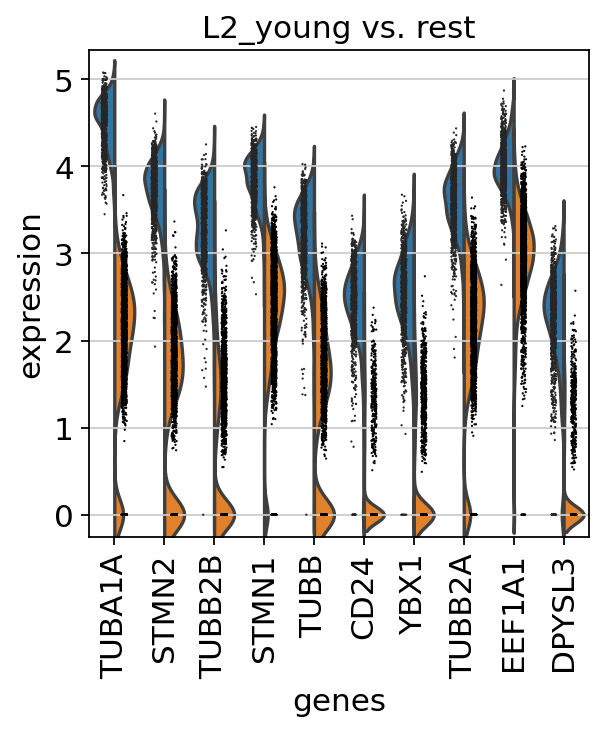

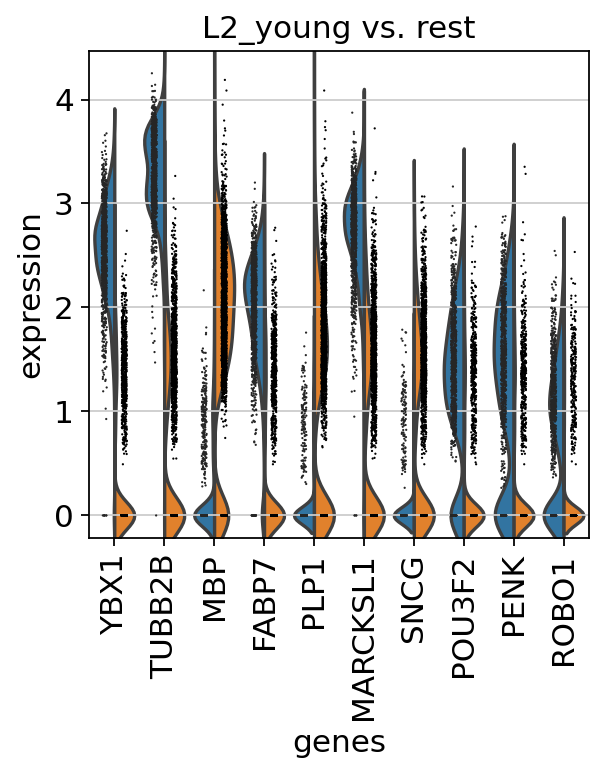

In [27]:
genes1 = genes_rank_df.index[:10].tolist()
genes2 = top_genes_df.index[:10].tolist()
sc.pl.rank_genes_groups_violin(de_adata, gene_names=genes1, groups=groups[0])
sc.pl.rank_genes_groups_violin(de_adata, gene_names=genes2, groups=groups[0])

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


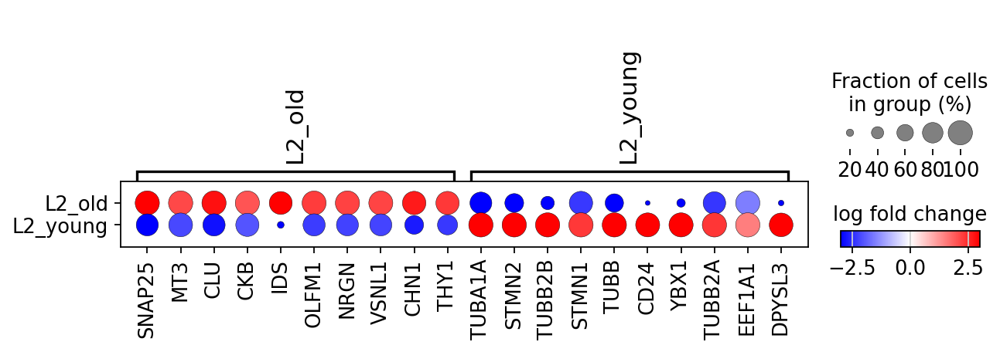

In [28]:
sc.pl.rank_genes_groups_dotplot(de_adata, groupby="label", n_genes=10, values_to_plot='logfoldchanges',
                                min_logfoldchange=1, vmax=3, vmin=-3, cmap='bwr')

### Посмотрим на отдельные образцы

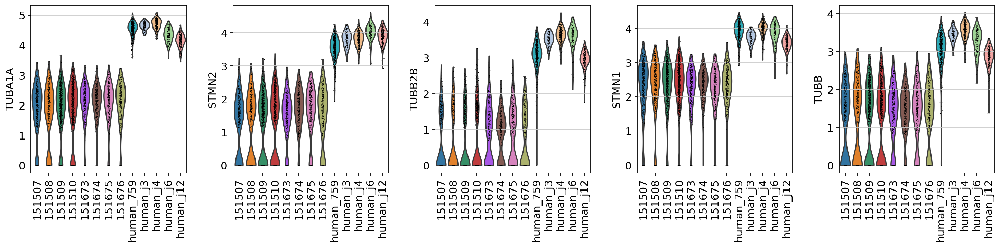

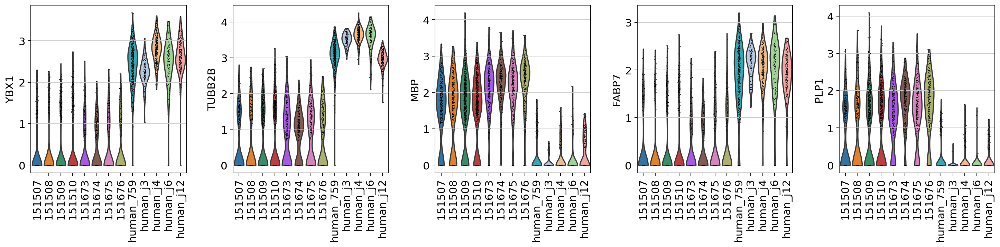

In [29]:
sc.pl.violin(de_adata, genes1[:5], groupby='sample_id', rotation=90)
sc.pl.violin(de_adata, genes2[:5], groupby='sample_id', rotation=90)

/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


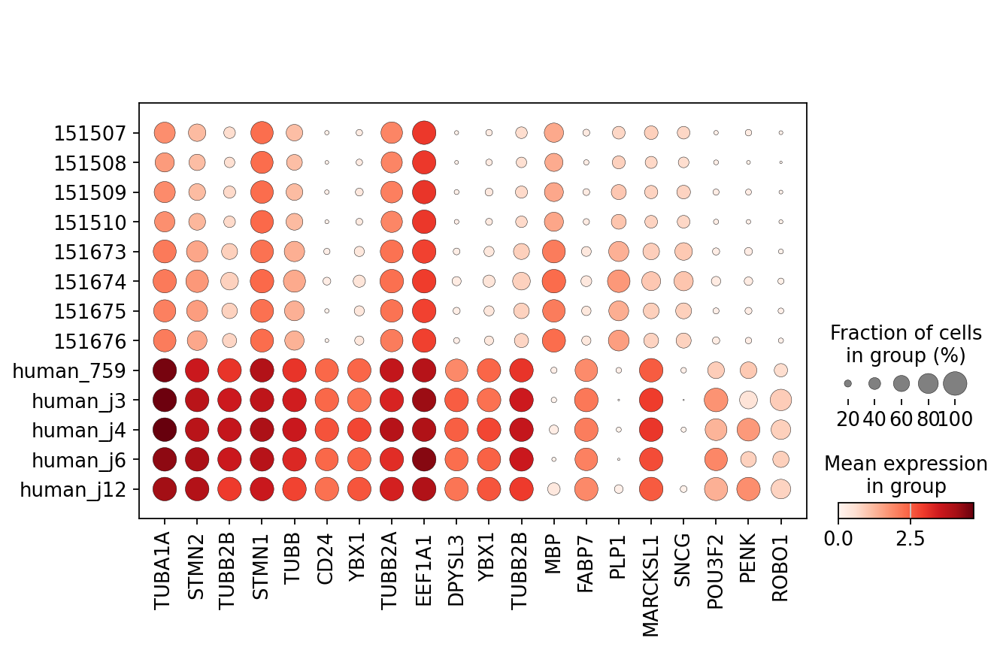

In [30]:
sc.pl.dotplot(de_adata, genes1 + genes2, groupby='sample_id')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_sample_id']`
categories: 151507, 151508, 151509, etc.
var_group_labels: L2_old, L2_young


/usr/local/lib/python3.9/dist-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


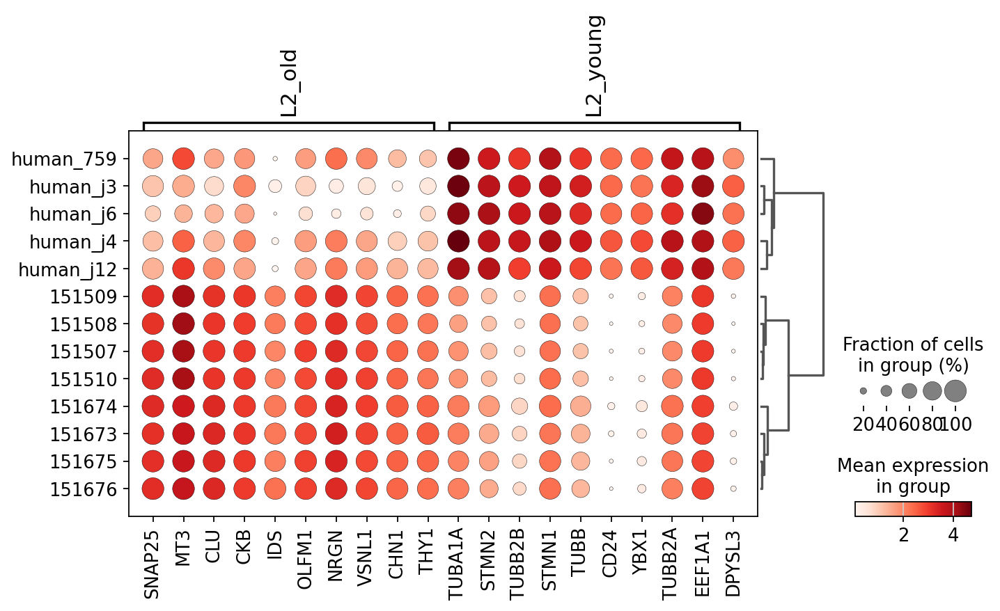

In [31]:
sc.pl.rank_genes_groups_dotplot(de_adata, groupby="sample_id", n_genes=10)

### Сохраним csv файл

In [32]:
genes_rank_df = sc.get.rank_genes_groups_df(de_adata, group=groups[0])
genes_rank_df.to_csv(dir_path + 'DE/young_vs_old_scanpy/' + key + '.csv')

## Gene Set Analysis

In [33]:
gene_set_names = gseapy.get_library_name(organism='Human')
gene_set_names[:5]
#gene_set_names

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues']

Выберем только дифференциально экспрессированые гены

In [44]:
gene_set = sc.get.rank_genes_groups_df(de_adata, group=groups[0], log2fc_min=0.25, pval_cutoff=0.05).set_index('names').loc[de_adata.var["highly_variable"]]
gene_set = gene_set[(gene_set.pct_nz_group > 0.1) & (gene_set.pct_nz_reference > 0.2)]
gene_list = gene_set.index.str.strip().tolist()
print(len(gene_list))

201


Возьмём базу данных `GO_Biological_Process_2021`

In [45]:
enr_res = gseapy.enrichr(gene_list=gene_list,
                     organism='Human',
                     gene_sets='GO_Biological_Process_2021',
                     cutoff = 0.5)

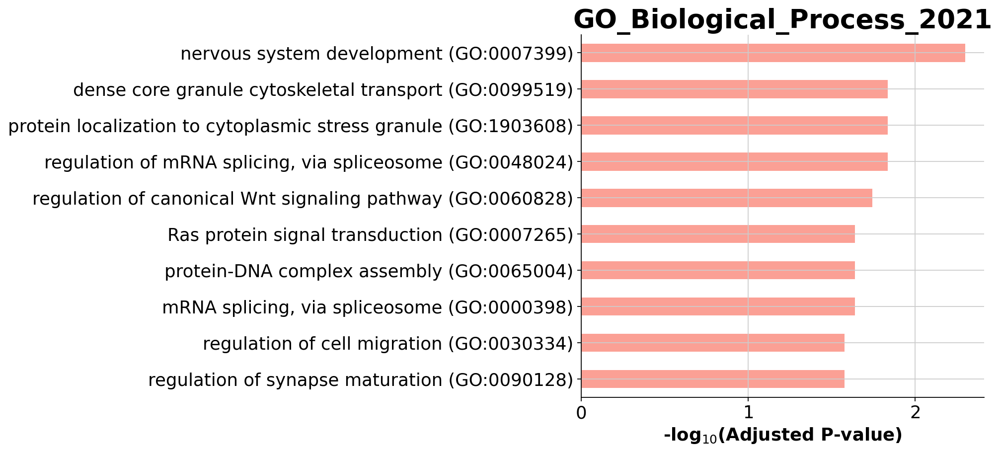

In [46]:
gseapy.barplot(enr_res.res2d, title='GO_Biological_Process_2021')

## GSEA

### Scores

In [37]:
scores = (
    sc.get.rank_genes_groups_df(de_adata, group=groups[0])
    .set_index('names')
    .loc[de_adata.var["highly_variable"]]
    .sort_values("scores", ascending=False)
    [['scores']]
    .rename_axis(["young_L1"], axis=1)
    )
scores

young_L1,scores
names,
TUBB2B,46.897518
YBX1,46.122044
MARCKSL1,44.441204
FABP7,42.106602
SOX4,36.047310
...,...
HPCAL1,-34.406334
MBP,-36.284393
NRGN,-42.129551


In [38]:
res = gseapy.prerank(rnk=scores, gene_sets='KEGG_2021_Human')

In [48]:
res.res2d.head()

,es,nes,pval,fdr,geneset_size,matched_size,genes,ledge_genes
Term,,,,,,,,
Mineral absorption,-0.779269,-2.289500,0.0,0.000000,60,18,SLC8A1;SLC11A2;SLC40A1;MT1A;MT1F;S100G;MT1H;MT...,MT1E;MT1M;MT1X;TF;ATP2B4;ATP1A2;ATP2B1;ATP1B2;...
Staphylococcus aureus infection,-0.841290,-2.509634,0.0,0.000000,95,22,FPR1;FCGR1A;ITGB2;C5;C2;C1R;FCGR2A;C1QA;HLA-DM...,HLA-DQA1;HLA-DMA;C1QC;KRT15;HLA-DRB5;HLA-DRB1;...
Salivary secretion,-0.781636,-2.125942,0.0,0.000389,93,16,GNAQ;ADCY8;KCNMA1;CD38;KCNN4;ADRA1D;PRKCA;CALM...,PRKCA;CALML5;MUC5B;ATP2B4;ATP1A2;ATP2B1;ATP1B2...
Pancreatic secretion,-0.725897,-2.131315,0.0,0.000467,102,19,GNAQ;PLA2G12A;ADCY8;RAB8A;KCNMA1;SLC4A4;CEL;CD...,PRKCA;CPB1;PRSS3;ATP2B4;ATP1A2;ATP2B1;ATP1B2;P...
Complement and coagulation cascades,-0.737100,-2.139000,0.0,0.000584,85,18,F3;TFPI;PROS1;F13A1;PROCR;ITGB2;C5;PLAU;C2;C1R...,C1QC;A2M;C3;CFD;CLU


In [40]:
terms = res.res2d.index
terms[:20]

Index(['Mineral absorption', 'Staphylococcus aureus infection',
       'Salivary secretion', 'Pancreatic secretion',
       'Complement and coagulation cascades',
       'Antigen processing and presentation',
       'Natural killer cell mediated cytotoxicity', 'Insulin secretion',
       'Aldosterone synthesis and secretion', 'Diabetic cardiomyopathy',
       'Type I diabetes mellitus', 'Systemic lupus erythematosus',
       'Thyroid hormone synthesis', 'Viral myocarditis',
       'Gastric acid secretion', 'Amyotrophic lateral sclerosis',
       'Glutamatergic synapse', 'Protein digestion and absorption',
       'Parkinson disease', 'Non-alcoholic fatty liver disease'],
      dtype='object', name='Term')

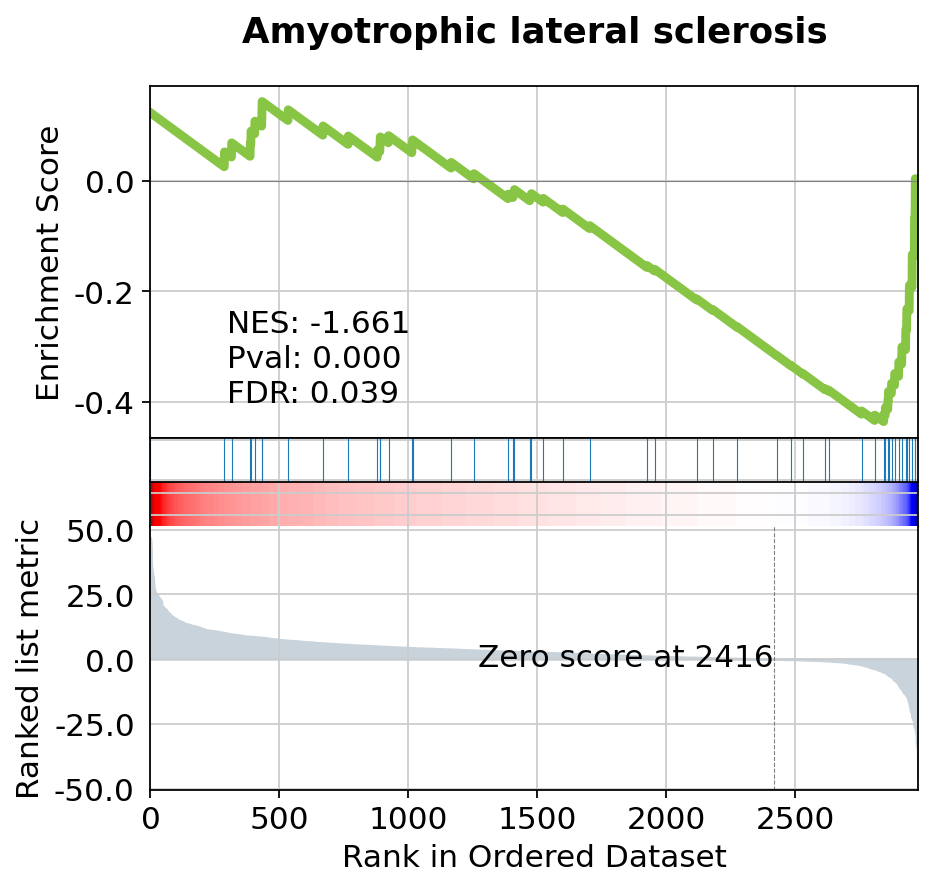

In [49]:
gseapy.gseaplot(rank_metric=res.ranking, term=terms[15], **res.results[terms[15]])

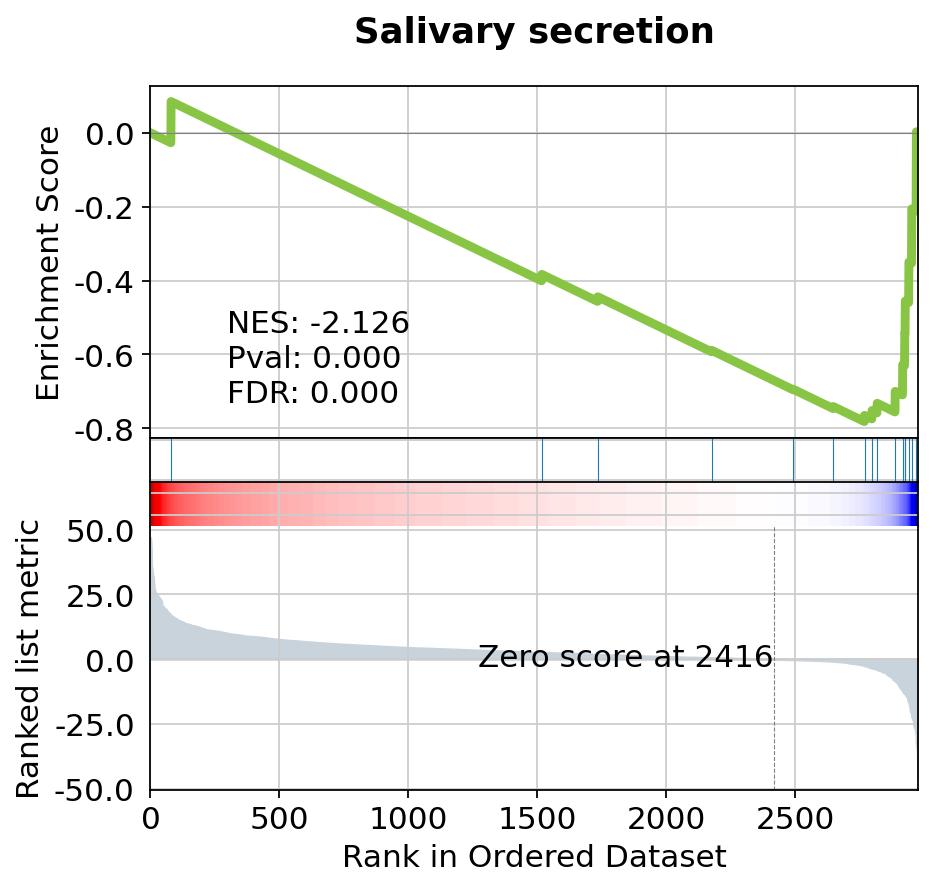

In [50]:
gseapy.gseaplot(rank_metric=res.ranking, term=terms[2], **res.results[terms[2]])